In [4]:
import os
from pathlib import Path

import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline 

import torch
import torchvision
import torchio as tio
import torch.nn.functional as F

print('TorchIO version:', tio.__version__)

TorchIO version: 0.18.71


In [5]:
training_dir = '/home/faird/shared/projects/3D_MRI_GAN/tio_unet/training_data/ECHO_pre'
experiments_dir = '/home/faird/shared/projects/3D_MRI_GAN/tio_unet/experiments/ECHO_51'

In [6]:
T1_dir = Path(os.path.join(training_dir, 'T1w'))
T2_dir = Path(os.path.join(training_dir, 'T2w'))
T1_paths = sorted(T1_dir.glob('*.nii.gz'))
T2_paths = sorted(T2_dir.glob('*.nii.gz'))
assert len(T1_paths) == len(T2_paths)

subjects = []
for (T1_path, T2_path) in zip(T1_paths, T2_paths):
    subject = tio.Subject(
        T1w=tio.ScalarImage(T1_path),
        T2w=tio.ScalarImage(T2_path)
    )
    subjects.append(subject)
dataset = tio.SubjectsDataset(subjects)
print('Dataset size:', len(dataset), 'subjects')
subject_1 = dataset[0]
print(subject_1)
print(subject_1.T1w)
print(subject_1.T2w)

Dataset size: 62 subjects
Subject(Keys: ('T1w', 'T2w'); images: 2)
ScalarImage(shape: (1, 182, 218, 182); spacing: (1.00, 1.00, 1.00); orientation: LAS+; dtype: torch.FloatTensor; memory: 27.5 MiB)
ScalarImage(shape: (1, 182, 218, 182); spacing: (1.00, 1.00, 1.00); orientation: LAS+; dtype: torch.FloatTensor; memory: 27.5 MiB)


In [7]:
def plot_histogram(axis, tensor, num_positions=100, label=None, alpha=0.05, color=None):
    values = tensor.numpy().ravel()
    kernel = stats.gaussian_kde(values)
    positions = np.linspace(values.min(), values.max(), num=num_positions)
    histogram = kernel(positions)
    kwargs = dict(linewidth=1, color='black' if color is None else color, alpha=alpha)
    if label is not None:
        kwargs['label'] = label
    axis.plot(positions, histogram, **kwargs)

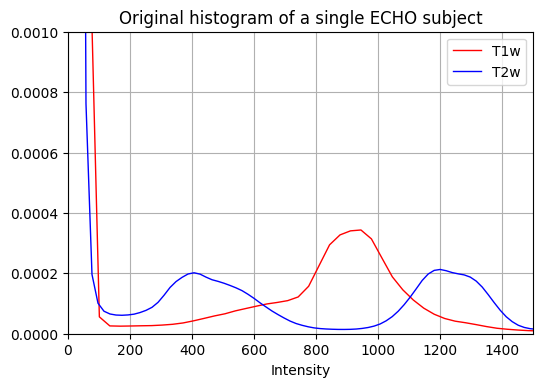

In [5]:
fig, ax = plt.subplots(dpi=100)
plot_histogram(ax, subject_1.T1w.data, label='T1w', alpha=1, color='red')
plot_histogram(ax, subject_1.T2w.data, label='T2w', alpha=1, color='blue')
ax.set_title('Original histogram of a single ECHO subject')
ax.set_xlabel('Intensity')
ax.set_ylim(0, 0.001)
ax.set_xlim(0, 1500)
ax.legend()
ax.grid()
#fig.savefig('ECHO_subject_histogram.png')

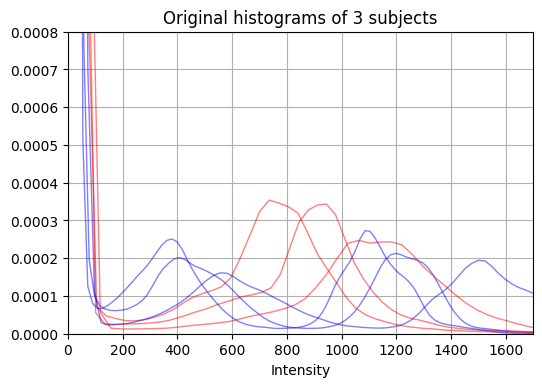

In [7]:
fig, ax =plt.subplots(dpi=100)
num_subjects = 3
i = 0
for (T1_path, T2_path) in zip(T1_paths, T2_paths):
    i+=1
    print('Plotting {} of {}'.format(i, num_subjects), end='\r')
    T1_tensor = tio.ScalarImage(T1_path).data
    T2_tensor = tio.ScalarImage(T2_path).data
    plot_histogram(ax, T1_tensor, color='red', alpha=0.5)
    plot_histogram(ax, T2_tensor, color='blue', alpha=0.5)
    if i == num_subjects:
        break
ax.set_xlim(0, 1700)
ax.set_ylim(0, 0.0008);
ax.set_title('Original histograms of ' + str(num_subjects) + ' subjects')
ax.set_xlabel('Intensity')
ax.grid()
graph = None
fig.show()
#fig.savefig('original_histograms_testing_data.png')

[]

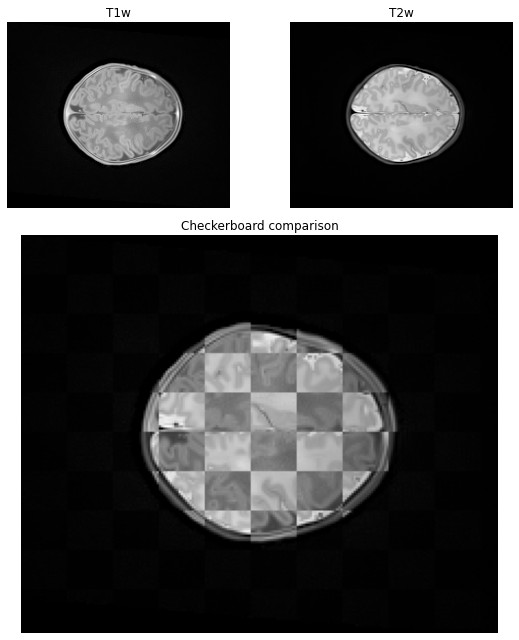

In [8]:
from matplotlib.gridspec import GridSpec
from skimage.util import compare_images

img1 = dataset[1].T1w.data[0,:,:,100]
img2 = dataset[1].T2w.data[0,:,:,100]
comp = compare_images(img1, img2, method='checkerboard', n_tiles=(10,10))

fig = plt.figure(figsize=(8, 9))

gs = GridSpec(3, 2)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1:, :])

ax0.imshow(img1, cmap='gray')
ax0.set_title('T1w')
ax1.imshow(img2, cmap='gray')
ax1.set_title('T2w')
ax2.imshow(comp, cmap='gray')
ax2.set_title('Checkerboard comparison')
for a in (ax0, ax1, ax2):
    a.axis('off')
plt.tight_layout()
plt.plot()

[]

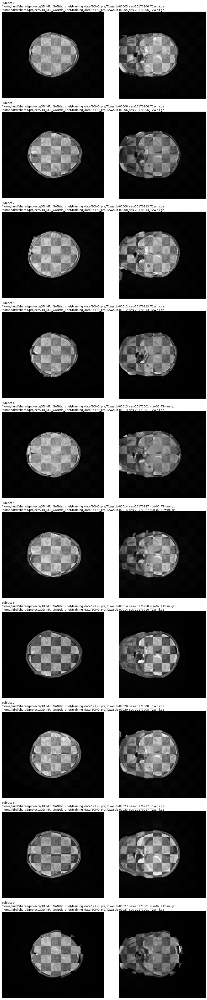

In [11]:
from matplotlib.gridspec import GridSpec
from skimage.util import compare_images

num_subs = 10
fig = plt.figure(figsize=(13, 6*num_subs))
gs = GridSpec(num_subs, 2)

for i in range(0, num_subs):
    #print(T1_paths[i])
    #print(T2_paths[i])
    cor_T1 = dataset[i].T1w.data[0,:,:,100]
    cor_T2 = dataset[i].T2w.data[0,:,:,100]
    cor_comp = compare_images(cor_T1, cor_T2, method='checkerboard', n_tiles=(10,10))
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.imshow(cor_comp, cmap='gray')
    ax1.axis('off')
    ax1.set_title('Subject ' + str(i) + '\n' + str(T1_paths[i]) + '\n' + str(T2_paths[i]), loc='left')
    
    sag_T1 = dataset[i].T1w.data[0,:,130,:]
    sag_T2 = dataset[i].T2w.data[0,:,130,:]
    sag_comp = compare_images(sag_T1, sag_T2, method='checkerboard', n_tiles=(10,10))
    ax2 = fig.add_subplot(gs[i, 1])
    ax2.imshow(sag_comp, cmap='gray')
    ax2.axis('off')
    
plt.tight_layout()
plt.plot()

In [9]:
# Histogram Standardization

T1w_histogram_landmarks_path = os.path.join(experiments_dir, 'ECHO_T1w_landmarks.npy')
T2w_histogram_landmarks_path = os.path.join(experiments_dir, 'ECHO_T2w_landmarks.npy')

if os.path.exists(T1w_histogram_landmarks_path) and os.path.exists(T2w_histogram_landmarks_path):
    T1_landmarks = np.load(T1w_histogram_landmarks_path)
    T2_landmarks = np.load(T2w_histogram_landmarks_path)
else:
    T1_landmarks = tio.HistogramStandardization.train(
        T1_paths,
        output_path = T1w_histogram_landmarks_path,
    )
    T2_landmarks = tio.HistogramStandardization.train(
        T2_paths,
        output_path = T2w_histogram_landmarks_path,
    )
    
np.set_printoptions(suppress=True, precision=3)
print('\nTrained T1w landmarks', T1_landmarks)
print('\nTrained T2w landmarks', T2_landmarks)



Trained T1w landmarks [  0.      0.      1.006   1.272   1.458   1.813   2.129   2.471   2.981
   3.429   4.312  63.262 100.   ]

Trained T2w landmarks [  0.      0.      0.305   0.398   0.472   0.622   0.819   1.079   1.48
   1.805   2.391  29.573 100.   ]


In [10]:
landmarks_dict = {'T1w': T1_landmarks, 'T2w': T2_landmarks}
histogram_transform = tio.HistogramStandardization(landmarks_dict)

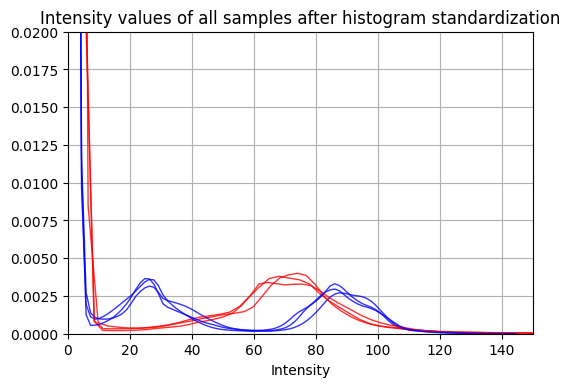

In [14]:
num_subjects = 3

fig, ax = plt.subplots(dpi=100)
for i, sample in enumerate(dataset):
    i+=1
    print('Plotting {} of {}'.format(i, num_subjects), end='\r')
    standard = histogram_transform(sample)
    T1w_tensor = standard.T1w.data
    T2w_tensor = standard.T2w.data
    plot_histogram(ax, T1w_tensor, color='red', alpha=0.8)
    plot_histogram(ax, T2w_tensor, color='blue', alpha=0.8)
    if i == num_subjects:
        break
ax.set_xlim(0, 150)
ax.set_ylim(0, 0.02)
ax.set_title('Intensity values of all samples after histogram standardization')
ax.set_xlabel('Intensity')
ax.grid()
graph = None

In [11]:
histogram, bin_edges = np.histogram(T1w_tensor, bins=100, range=(0,278))
histogram[0] = 0

NameError: name 'T1w_tensor' is not defined

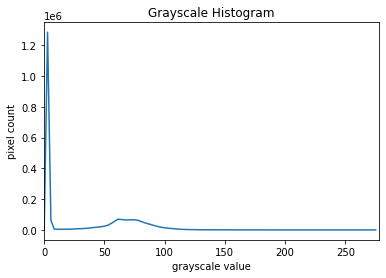

In [43]:
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("grayscale value")
plt.ylabel("pixel count")
plt.xlim([0.0, 278.0])  # <- named arguments do not work here

plt.plot(bin_edges[0:-1], histogram)  # <- or here
plt.show()

In [41]:
max(T1w_tensor.numpy().ravel())

277.13248

[]

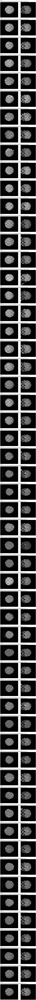

In [8]:
from matplotlib.gridspec import GridSpec
from skimage.util import compare_images

num_subjects = 3
fig = plt.figure(figsize=(13, 6*num_subs))
gs = GridSpec(num_subs, 2)

for i, sample in enumerate(dataset):
    #i+=1
    print('Plotting {} of {}'.format(i, num_subjects), end='\r')
    standard = histogram_transform(sample)

    cor_T1 = standard.T1w.data[0,:,:,100]
    cor_T2 = standard.T2w.data[0,:,:,100]
    cor_comp = compare_images(cor_T1, cor_T2, method='checkerboard', n_tiles=(10,10))
    ax1 = fig.add_subplot(gs[i, 0])
    ax1.imshow(cor_comp, cmap='gray')
    ax1.axis('off')
    ax1.set_title('Subject ' + str(i) + '\n' + str(T1_paths[i]) + '\n' + str(T2_paths[i]), loc='left')
    
    sag_T1 = standard.T1w.data[0,:,130,:]
    sag_T2 = standard.T2w.data[0,:,130,:]
    sag_comp = compare_images(sag_T1, sag_T2, method='checkerboard', n_tiles=(10,10))
    ax2 = fig.add_subplot(gs[i, 1])
    ax2.imshow(sag_comp, cmap='gray')
    ax2.axis('off')
    
plt.tight_layout()
plt.plot()

In [16]:
import sys

sys.path.append('/home/faird/shared/projects/3D_MRI_GAN/tio_unet/code')

from model import UNet

# Create UNet and initialize with pretrained weights
net = UNet()
weights_path = '/home/faird/shared/projects/3D_MRI_GAN/tio_unet/experiments/ECHO_51/T1toT2_model_gpu_epoch-131.pth'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
net.load_state_dict(torch.load(weights_path, map_location=device))
net.to(device=device)
net.eval()

#standard = histogram_transform(dataset._subjects[0])
standard = dataset._subjects[0]
patch_size = 100, 100, 100
patch_overlap = 4, 4, 4
grid_sampler = tio.inference.GridSampler(
    standard,
    patch_size,
    patch_overlap,
)
patch_loader = torch.utils.data.DataLoader(
    grid_sampler, batch_size=1)
aggregator = tio.inference.GridAggregator(grid_sampler, overlap_mode='average')

with torch.no_grad():
    for patches_batch in patch_loader:
        inputs = patches_batch['T1w'][tio.DATA].to(device)
        locations = patches_batch[tio.LOCATION]
        pred_T2 = net(inputs)
        aggregator.add_batch(pred_T2, locations)

prediction = aggregator.get_output_tensor()



In [7]:
histogram_transform

HistogramStandardization(landmarks={'T1w': array([  0.   ,   0.   ,   1.006,   1.272,   1.458,   1.813,   2.129,
         2.471,   2.981,   3.429,   4.312,  63.262, 100.   ]), 'T2w': array([  0.   ,   0.   ,   0.305,   0.398,   0.472,   0.622,   0.819,
         1.079,   1.48 ,   1.805,   2.391,  29.573, 100.   ])}, masking_method=None)

In [16]:
standard = histogram_transform(dataset._subjects[0])

In [17]:
standard

Subject(Keys: ('T1w', 'T2w'); images: 2)

In [17]:
T2_pred_subject = tio.Subject(T2w=tio.ScalarImage(tensor=prediction))
T2w_histogram_landmarks_path = os.path.join(experiments_dir, 'ECHO_T2w_landmarks.npy')
T2_landmarks = np.load(T2w_histogram_landmarks_path)
T2_landmarks_dict = {'T2w': T2_landmarks}
T2_hist_transform = tio.HistogramStandardization(T2_landmarks_dict)
transform = tio.Compose([T2_hist_transform])
T2_std = transform(T2_pred_subject)

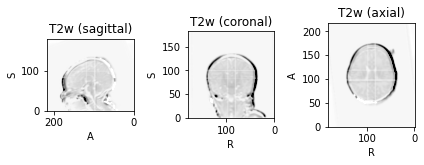

In [18]:
T2_pred_subject.plot()

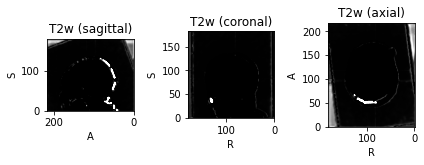

In [19]:
T2_std.plot()

In [ ]:
T1_dir = Path(os.path.join(training_dir, 'T1w'))
T2_dir = Path(os.path.join(training_dir, 'T2w'))
T1_paths = sorted(T1_dir.glob('*.nii.gz'))
T2_paths = sorted(T2_dir.glob('*.nii.gz'))
assert len(T1_paths) == len(T2_paths)

subjects = []
for (T1_path, T2_path) in zip(T1_paths, T2_paths):
    subject = tio.Subject(
        T1w=tio.ScalarImage(T1_path),
        T2w=tio.ScalarImage(T2_path)
    )
    subjects.append(subject)
dataset = tio.SubjectsDataset(subjects)
print('Dataset size:', len(dataset), 'subjects')
subject_1 = dataset[0]
print(subject_1)
print(subject_1.T1w)
print(subject_1.T2w)